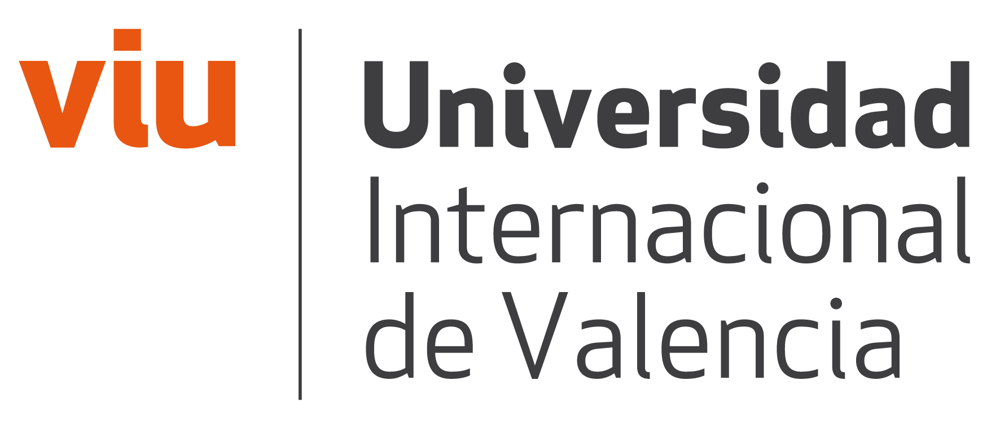

-----
# <center>**ACTIVIDAD FINAL - RUBEN ADRIAN BAQUEL**</center>
-----

----
# <center> **INTRODUCCION A PYTHON**</center>
----

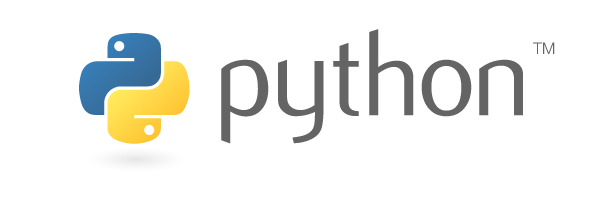

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import zipfile # para descomprimir archivos zip
import urllib.request # para descargar de URL
import os
# importing required modules 
from zipfile import ZipFile
from scipy.stats import norm

%matplotlib inline


<img src='https://static.billboard.com/files/2020/05/spotify-logo-icon-phone-2020-billboard-1548-1590604460-compressed.jpg' width=80% height=60% >

En este proyecto de actividad final estaremos trabajando con algunos datasets disponibles en la página web de https://www.kaggle.com/ acerca del famoso portal de música Spotify el cual reúne informacion en varios datasets acerca de distintos artistas a través de los años, géneros musicales, canciones etc etc.

La idea del proyecto es mostrar algunas de las funciones comentadas y analizadas en la asignatura de las librerias que nos brinda python como: Numpy, Pandas, Matplotlib y Seaborn, que nos ayudaran y permitiran mostrar distintas características de los datasets en cuestión.

 * 1. **Introducción y Presentación.**

 * 2. **Lectura de Datasets.**

 * 3. **EDA.**
 
 * 4. **Análisis Estadístico.**
 
 * 5. **Fin.**


## 1. Introducción y Presentación.

Como se comento anteriormente la idea del proyecto final de la asignatura tiene como objetivos:

* Aplicar diferentes técnicas de tratamiento de datos explicadas durante el curso
* Explorar datos y evaluarlos mediante el uso de Pandas
* Aplicar adecuadamente técnicas de visualización
* Desarrollar una capacidad crítica y conocer fuentes de información

De tal manera se han seleccionado algunos datsets para llegar a cumplir con tales objetivos propuestos.



## 2. Lectura de Datsets

Los datasets con los cuales se van a trabajar se han descargado del portal que dispone kaggle y que son de acceso libre para cualquier usuario. 

https://www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks


El primer dataset con el cual vamos a trabajar es el **data.csv**, el cual dispone de los siguientes registros:

• **id** (Id of track generated by Spotify)

• **artists** (List of artists mentioned)

• **name** (Name of the song)

• **genres** (Genre of the song)

• **year** (Ranges from 1921 to 2020)

• **duration_ms** (Integer typically ranging from 200k to 300k)

• **mode** (0 = Minor, 1 = Major)

• **explicit** (0 = No explicit content, 1 = Explicit content)

• **key** (All keys on octave encoded as values ranging from 0 to 11, starting on C as 0, C# as 1 and so on…)

• **popularity :** The popularity of a track is a value between 0 and 100, with 100 being the most popular. The popularity is calculated by algorithm and is based, in the most part, on the total number of plays the track has had and how recent those plays are.Generally speaking, songs that are being played a lot now will have a higher popularity than songs that were played a lot in the past. Duplicate tracks (e.g. the same track from a single and an album) are rated independently. Artist and album popularity is derived mathematically from track popularity. Note that the popularity value may lag actual popularity by a few days: the value is not updated in real time.

• **acousticness :** A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic.

• **danceability :** Describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.

• **energy :** Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy.

• **instrumentalness :** Predicts whether a track contains no vocals. “Ooh” and “aah” sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly “vocal.” The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.

• **valence :** A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).

• **tempo :** The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration.

• **liveness :** Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live.

• **loudness** (Float typically ranging from -60 to 0)

• **speechiness :** Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks.

In [2]:
## Creamos una ruta para luego leer el dataset:

ruta_data = os.path.join("res", "Spotify", "data.csv")
data = pd.read_csv(ruta_data, sep=',', engine='python', encoding='utf8')

display(data.head(3))

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339


El conjunto de datos contiene más de 170.000 canciones recopiladas de Spotify Web API. Las características incluyen canción, artista, fecha de lanzamiento, así como algunas características de la canción como acústica, danceability, volumen, tempo, etc. El tiempo de los registros es de 1921 a 2020.

Como vemos a continuacion a traves del atributo **shape** el dataset tiene una dimension (170653,19), es decir unas 170653 instancias con un total de 19 variables.

In [3]:
data.shape

(170653, 19)

In [4]:
# Ordenamos algunas variables y mostramos los 3 ultimos registros:

data = data.reindex(columns=['id','artists','name','year','duration_ms','mode','explicit', 
        'key','popularity','acousticness','danceability','energy',  
         'instrumentalness', 'valence','tempo','liveness', 'loudness','release_date',
       'speechiness'])
data.tail(3)

,id,artists,name,year,duration_ms,mode,explicit,key,popularity,acousticness,danceability,energy,instrumentalness,valence,tempo,liveness,loudness,release_date,speechiness
170650,4BZXVFYCb76Q0Klojq4piV,['MAMAMOO'],AYA,2020,211280,0,0,4,76,0.10100,0.634,0.858,0.000009,0.637,91.688,0.258,-2.226,2020-11-03,0.0809
170651,5SiZJoLXp3WOl3J4C8IK0d,['Eminem'],Darkness,2020,337147,1,1,2,70,0.00998,0.671,0.623,0.000008,0.195,75.055,0.643,-7.161,2020-01-17,0.3080
170652,7HmnJHfs0BkFzX4x8j0hkl,"['KEVVO', 'J Balvin']",Billetes Azules (with J Balvin),2020,189507,1,1,7,74,0.13200,0.856,0.721,0.004710,0.642,94.991,0.182,-4.928,2020-10-16,0.1080


In [5]:
## Visualizamos el tipo de variables que dispone el dataset y los posibles valores nulos en la misma: 

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
id                  170653 non-null object
artists             170653 non-null object
name                170653 non-null object
year                170653 non-null int64
duration_ms         170653 non-null int64
mode                170653 non-null int64
explicit            170653 non-null int64
key                 170653 non-null int64
popularity          170653 non-null int64
acousticness        170653 non-null float64
danceability        170653 non-null float64
energy              170653 non-null float64
instrumentalness    170653 non-null float64
valence             170653 non-null float64
tempo               170653 non-null float64
liveness            170653 non-null float64
loudness            170653 non-null float64
release_date        170653 non-null object
speechiness         170653 non-null float64
dtypes: float64(9), int64(6), object(4)
memory usage: 24.7+ MB


In [6]:
## Nos aseguramos que ninguna de las columnas tiene valores nulos:

data.isnull().sum()

id                  0
artists             0
name                0
year                0
duration_ms         0
mode                0
explicit            0
key                 0
popularity          0
acousticness        0
danceability        0
energy              0
instrumentalness    0
valence             0
tempo               0
liveness            0
loudness            0
release_date        0
speechiness         0
dtype: int64

A continuacion seleccionamos el segundo dataset by_artists el cual contiene los registros por artista.

In [7]:
## Seleccionamos el segundo dataset con el cual trabajaremos:

ruta_data = os.path.join("res", "Spotify", "data_by_artist.csv")
artists = pd.read_csv(ruta_data, sep=',', engine='python', encoding='utf8')

display(artists.head(3))

,mode,count,acousticness,artists,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,9,0.590111,"""Cats"" 1981 Original London Cast",0.467222,250318.555556,0.394003,0.011400,0.290833,-14.448000,0.210389,117.518111,0.389500,38.333333,5
1,1,26,0.862538,"""Cats"" 1983 Broadway Cast",0.441731,287280.000000,0.406808,0.081158,0.315215,-10.690000,0.176212,103.044154,0.268865,30.576923,5
2,1,7,0.856571,"""Fiddler On The Roof” Motion Picture Chorus",0.348286,328920.000000,0.286571,0.024593,0.325786,-15.230714,0.118514,77.375857,0.354857,34.857143,0


In [8]:
## Seleccionamos el tercer dataset de género musical con el cual trabajaremos:

ruta_data = os.path.join("res", "Spotify", "data_by_genres.csv")
genres = pd.read_csv(ruta_data, sep=',', engine='python', encoding='utf8')

display(genres.head(3))

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.3616,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.1310,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.1260,-9.180000,0.047000,133.444000,0.975000,48.000000,7


## 3. EDA - Exploratory Data Analysis

En esta sección daremos paso al Análisis Explorarorio de los datasets en donde haran desde reconversión de variables, eliminación de variables, análisis gráficos y demás.


In [9]:
## Para un mejor análisis se descartan algunas de las variables del dataset:

data = data.drop(['id','release_date','key','explicit','liveness','loudness'],axis=1)

In [10]:
## Transformamos la variable duration_ms en la variable minutes:
## Para ello se divide la variable duration_ms por 60000 para conevrtirla en minutos.

data['minutes'] = data['duration_ms']/60000
data = data.drop(['duration_ms'],axis=1)

In [11]:
data.head(3)

,artists,name,year,mode,popularity,acousticness,danceability,energy,instrumentalness,valence,tempo,speechiness,minutes
0,"['Sergei Rachmaninoff', 'James Levine', 'Berli...","Piano Concerto No. 3 in D Minor, Op. 30: III. ...",1921,1,4,0.982,0.279,0.211,0.878,0.0594,80.954,0.0366,13.861117
1,['Dennis Day'],Clancy Lowered the Boom,1921,1,5,0.732,0.819,0.341,0.000,0.9630,60.936,0.4150,3.008883
2,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,Gati Bali,1921,1,5,0.961,0.328,0.166,0.913,0.0394,110.339,0.0339,8.334367


Se puede ver que la variable **artists** posee [] y " " los cuales los eliminamos para una mejor visualización de la variable.

In [12]:
data["artists"]=data["artists"].astype(str)
data["artists"]=data["artists"].str.strip('[]"')
data["artists"]=data["artists"].str.replace('\'','').str.replace('"',"")

In [13]:
## Vemos la cantidad de artistas unicos que posee el dataset:

data.artists.nunique()

34087

In [14]:
## Seleccionamos con el método value_counts el conteo de los artistas:

data.artists.value_counts()

Эрнест Хемингуэй                                           1211
Эрих Мария Ремарк                                          1068
Francisco Canaro                                            942
Frank Sinatra                                               630
Ignacio Corsini                                             628
                                                           ... 
Ski Mask The Slump God, Jacquees, Coi Leray, LouGotCash       1
Don Sebesky                                                   1
Ritmo Y Sabor                                                 1
CES Cru                                                       1
Merry Clayton                                                 1
Name: artists, Length: 34087, dtype: int64

En términos de una mejor compresión del dataset vemos que hay dos artistas de procedencia rusa, los cuales pasamos a eliminarlos del dataset. Esta tecnica permite elimnar algunas instrancias que cumplan una determinada condicon, en este caso los nombres: **Эрнест Хемингуэй** y **Эрих Мария Ремарк**.

In [15]:
data = data.drop(data.loc[data['artists'] == 'Эрнест Хемингуэй'].index)
data = data.drop(data.loc[data['artists'] == 'Эрих Мария Ремарк'].index)

In [16]:
## Mostramos nuevamente con los artistas eliminados, los primeros 10 registros:

data.artists.value_counts()[:10]

Francisco Canaro            942
Frank Sinatra               630
Ignacio Corsini             628
Elvis Presley               504
Johnny Cash                 484
Bob Dylan                   474
The Rolling Stones          471
The Beach Boys              455
Francisco Canaro, Charlo    453
Fleetwood Mac               437
Name: artists, dtype: int64

El artista **Francisco Canaro** aparece tambien como **Francisco Canaro, Charlo**, por ende procedemos a juntar todo en una único registro. 

In [17]:
data = data.replace(to_replace='Francisco Canaro, Charlo', value='Francisco Canaro')
data.artists.value_counts()[:10]

Francisco Canaro      1395
Frank Sinatra          630
Ignacio Corsini        628
Elvis Presley          504
Johnny Cash            484
Bob Dylan              474
The Rolling Stones     471
The Beach Boys         455
Fleetwood Mac          437
Dean Martin            420
Name: artists, dtype: int64

In [18]:
## A continuacion vemos los 10 primeros registros de las canciones con mayor conteo del dataset.

data.name.value_counts()[:10]

White Christmas       73
Winter Wonderland     63
Summertime            56
Jingle Bells          53
Overture              46
Silent Night          45
Home                  40
The Christmas Song    36
Silver Bells          36
Sleigh Ride           35
Name: name, dtype: int64

In [19]:
## Transformamos a partir de la variable year una nueva variable "decada" usando la funcion lambda:

data['decada'] = data.year.apply(lambda year : year-(year%10))
data.head(3)

,artists,name,year,mode,popularity,acousticness,danceability,energy,instrumentalness,valence,tempo,speechiness,minutes,decada
0,"Sergei Rachmaninoff, James Levine, Berliner Ph...","Piano Concerto No. 3 in D Minor, Op. 30: III. ...",1921,1,4,0.982,0.279,0.211,0.878,0.0594,80.954,0.0366,13.861117,1920
1,Dennis Day,Clancy Lowered the Boom,1921,1,5,0.732,0.819,0.341,0.000,0.9630,60.936,0.4150,3.008883,1920
2,KHP Kridhamardawa Karaton Ngayogyakarta Hadini...,Gati Bali,1921,1,5,0.961,0.328,0.166,0.913,0.0394,110.339,0.0339,8.334367,1920


In [20]:
## Seleccionamos el metodo describe para ver algunas medidas estadísticas de las variables cuantitativas

data.describe()

,year,mode,popularity,acousticness,danceability,energy,instrumentalness,valence,tempo,speechiness,minutes,decada
count,168374.000000,168374.000000,168374.000000,168374.000000,168374.000000,168374.000000,168374.000000,168374.000000,168374.000000,168374.000000,168374.000000,168374.000000
mean,1977.332741,0.707787,31.856759,0.504479,0.535258,0.486289,0.169268,0.528140,116.936624,0.087220,3.874547,1972.804827
std,25.647144,0.454781,21.663927,0.376777,0.176294,0.267202,0.314983,0.264432,30.692127,0.132089,2.103670,25.722165
min,1921.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.085133,1920.000000
25%,1957.000000,0.000000,13.000000,0.102000,0.413000,0.261000,0.000000,0.314000,93.560250,0.034800,2.856450,1950.000000
50%,1978.000000,1.000000,34.000000,0.523000,0.545000,0.477000,0.000248,0.539000,114.828000,0.044700,3.474883,1970.000000
75%,1999.000000,1.000000,48.000000,0.896000,0.665000,0.707000,0.111000,0.749000,135.649000,0.073000,4.389333,1990.000000
max,2020.000000,1.000000,100.000000,0.996000,0.988000,1.000000,1.000000,1.000000,243.507000,0.969000,90.058333,2020.000000


## Visualizacion.

A continuación vemos como primer gráfico el comportamiento de la variable energy a través de las distintas décadas que se encuentran en el dataset.
Se puede apreciar como a partir de la década del 70 en adelante la variable presenta un mismo patrón de comportamiento.

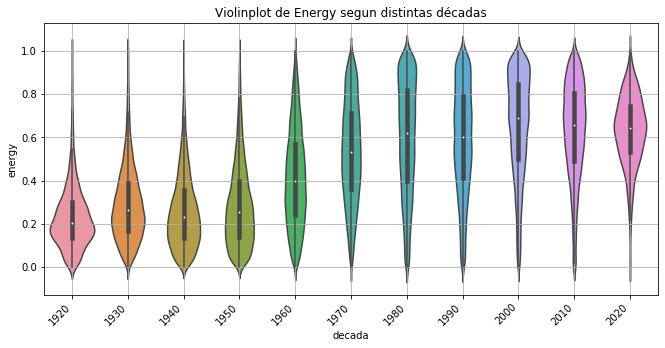

In [21]:
def violinplot(epoch, y):
    f, ax = plt.subplots(figsize=(11, 5))
    ax = sns.violinplot(x="decada", y='energy', data= data)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    plt.title("Violinplot de Energy segun distintas décadas")
    plt.grid()
    plt.show()
    
violinplot('year >= 1950 & year <= 2000', "energy")

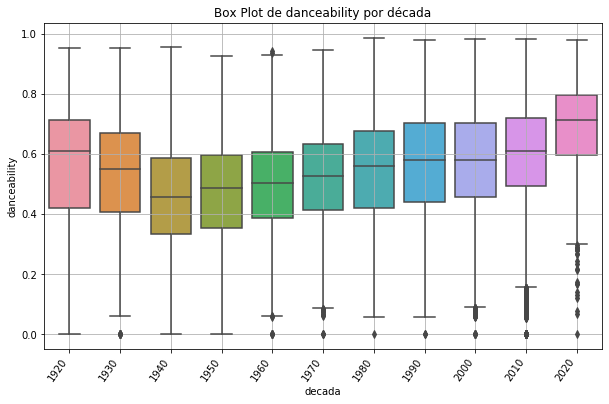

In [22]:
## BOX PLOT de la variable danceability por decada:

def boxplot(epoch, y):
    f, ax = plt.subplots(figsize=(10, 6))
    ax = sns.boxplot(x="decada", y='danceability', data= data)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=55, ha='right')
    plt.title('Box Plot de danceability por década')
    plt.grid()
    plt.show()
    
boxplot('year >= 1950 & year <= 2000', "danceability")

El mismo gráfico anterior pero ahora a partir del módulo plotly.

In [23]:
def boxplot(epoch, y):
    fig = px.box(data, x="decada", y='danceability')
    fig.show()
      
    
boxplot('year >= 1950 & year <= 2000', "danceability")

Recordamos que la variable **speechiness** detecta la presencia de palabras habladas en una pista. Cuanto más exclusivamente parecida a un discurso sea la grabación (por ejemplo, programa de entrevistas, audiolibro, poesía), más cercano a 1.0 será el valor del atributo. Los valores superiores a 0,66 describen pistas que probablemente estén compuestas en su totalidad por palabras habladas. Los valores entre 0,33 y 0,66 describen pistas que pueden contener tanto música como habla, ya sea en secciones o en capas, incluidos casos como la música rap. Los valores por debajo de 0,33 probablemente representen música y otras pistas que no se parecen al habla.

Por ello se transforma la variable en tres categorias: **High**,**Medium** y **Low**.

In [24]:
def speech(speechiness):
  if speechiness > 0.66:
    return 'High'
  elif speechiness > 0.33:
    return 'Medium'
  else:
    return 'Low'

data['speech'] = data['speechiness'].apply(speech)

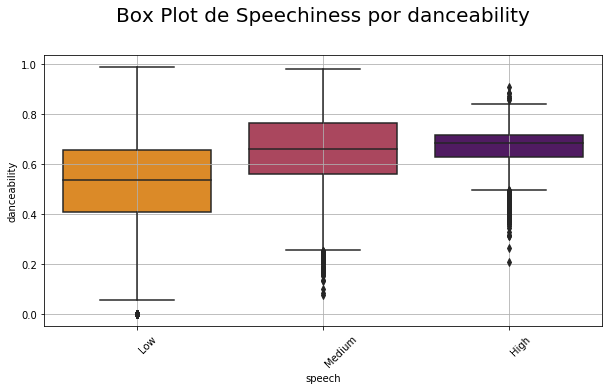

In [27]:
def boxplot(x, y):
    #plt.style.use('dark_background')
    f, ax = plt.subplots(figsize=(10, 5))
    ax = sns.boxplot(x="speech", y='danceability', data= data, palette='inferno_r')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left')
    plt.title('Box Plot de Speechiness por danceability',y=1.1, fontsize=20)
    plt.grid()
    plt.show()

boxplot('speech', "danceability")

A continuación veremos que no hay ningun tipo de corrrelacion entre las variables numéricas.

In [28]:
data_pair = data[['acousticness', 'danceability', 'instrumentalness','valence', 'minutes', 'speech']]
df_pair = data_pair.sample(5000)

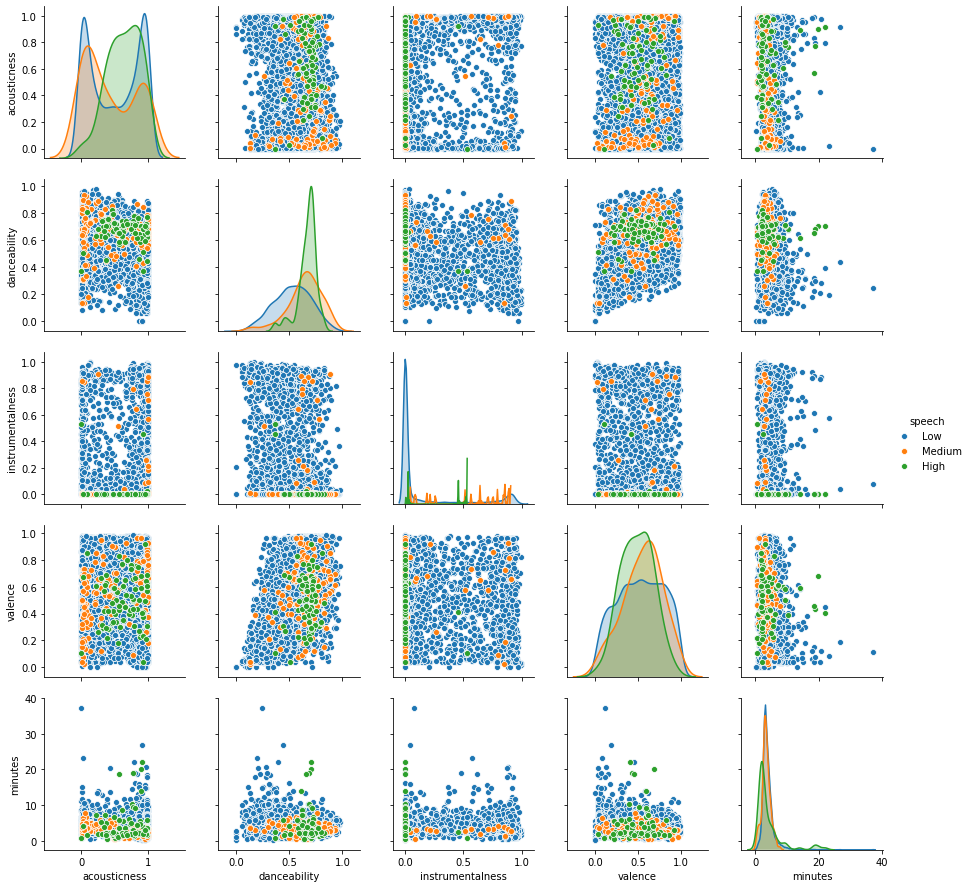

In [29]:
## Pairplot

sns.pairplot(df_pair, hue='speech')

La matriz de correlaciones para las variables numericas nos muestra la practicamente nula relacion entre las variables, imposibilitando la oportunidad de llevar adelante algun otro tipo de análisis de este tipo.


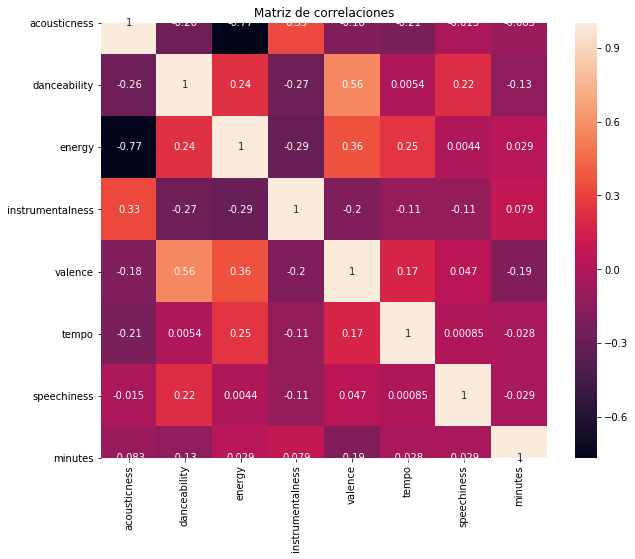

In [30]:
## Eliminamos algunas variables del data set:

data_corr= data.drop(['year','popularity','decada'],axis=1)

## Matriz de correlaciones:
plt.figure(figsize=(10,8))
corr = data_corr.set_index('mode').corr()
sns.heatmap(corr, annot=True)
plt.title("Matriz de correlaciones")
plt.show()

Siguiendo con la visualizacion del dataset pasamos a ver un el comportamiento de algunas de las variables como el caso de: acousticness, danceability, energy, valence y minutes a traves de los distintos años entre 1920 y 2020.

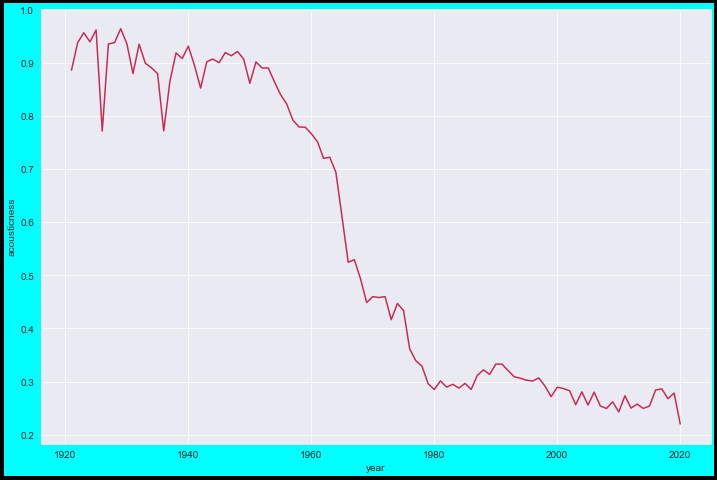

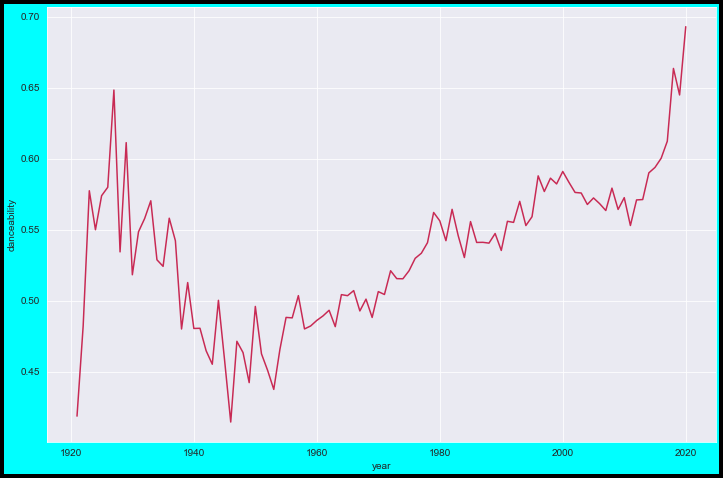

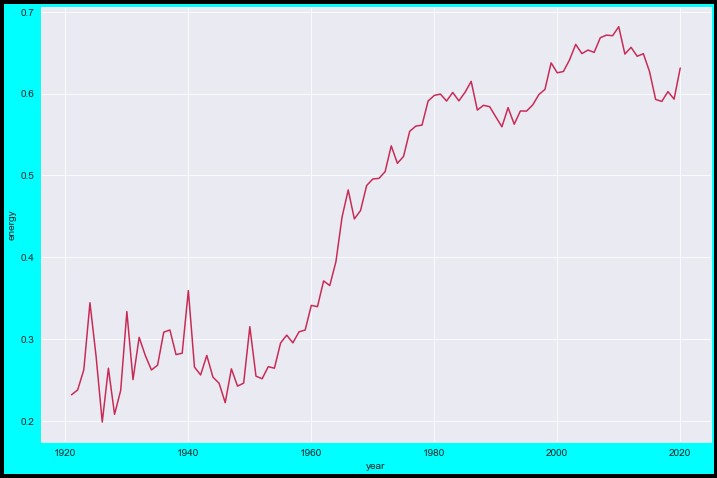

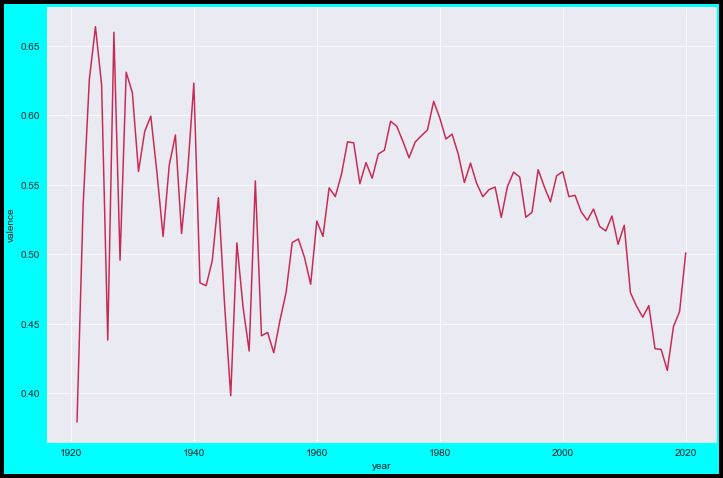

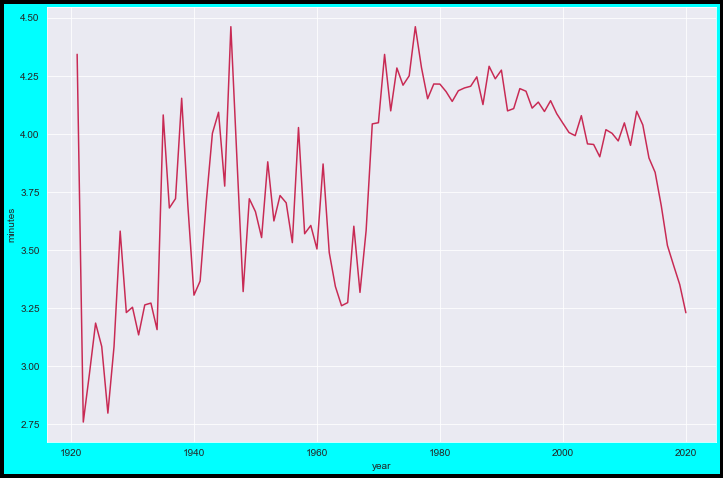

In [31]:
feature = ['acousticness', 'danceability', 'energy', 'valence', 'minutes' ]

colors = ['#C82A54','#0e47f2', '#c70404', '#791781', '#F8B60A']

for i in feature:
  y = data.groupby(by='year')[i].mean()
  x = y.index
  fig = plt.figure( figsize=(12,8),facecolor ="aqua", edgecolor= "black", linewidth=8)
  sns.set_style('darkgrid')
  sns.lineplot(x,y, color='#C82A54')
  plt.show()

Una de las variables del dataset data es la variable es valence la cual describe la positividad musical que transmite una cancion, donde un valor alto indica una cancion feliz, alegre. Caso contrario ocurre con valores bajos de valence, en donde suenan a canciones más tristes y melancólicas.

La cancion **Chatter** de **Katherine McNamara** es la que tiene el valor mas alto de valence.

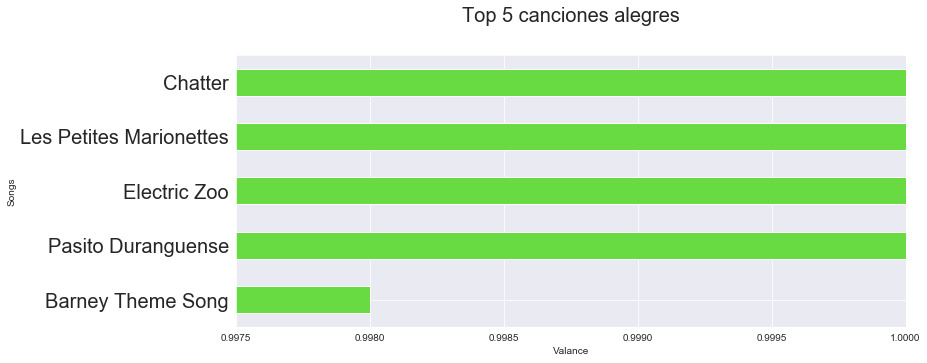

In [32]:
df = pd.DataFrame(data[['valence','name']]).sort_values('valence').tail().set_index('name')

ax = df.plot(kind='barh', 
          figsize = (12, 5), 
          width = 0.5,
          color='#67db41')
t='Top 5 canciones alegres'
plt.title(t,y=1.1,fontsize=20)
plt.xlabel('Valance')
plt.ylabel('Songs')
plt.yticks(fontsize=20)
plt.xlim(0.9975,1)
ax.get_legend().remove()

Pasaremos a trabajar a con algunos de los datasets para generar nuevos datsets que nos permitan mostrar una mayor visualizacion de los mismos.

In [33]:
## Para el dataset data, seleccionamos las varibles year, popularity y artists:

popularity = data[['year', 'popularity', 'artists']]
popularity.head(3)

,year,popularity,artists
0,1921,4,"Sergei Rachmaninoff, James Levine, Berliner Ph..."
1,1921,5,Dennis Day
2,1921,5,KHP Kridhamardawa Karaton Ngayogyakarta Hadini...


In [34]:
## Hacemos un agrupamiento a partir de groupby de artistas y año:

lista =data.artists.value_counts().index[:10]

date = data[data.artists.isin(lista)][['artists','year','energy']].groupby(['artists','year']).count().reset_index()
date = date.rename(columns={'energy':'song_count'})
date.head()

,artists,year,song_count
0,Bob Dylan,1962,13
1,Bob Dylan,1963,68
2,Bob Dylan,1964,21
3,Bob Dylan,1965,50
4,Bob Dylan,1966,72


In [35]:
df1 = pd.DataFrame(np.zeros((100,10)), columns=lista)
df1['year'] = np.arange(1921,2021)
df1.head(3)

,Francisco Canaro,Frank Sinatra,Ignacio Corsini,Elvis Presley,Johnny Cash,Bob Dylan,The Rolling Stones,The Beach Boys,Fleetwood Mac,Dean Martin,year
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1921
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1922
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1923


In [36]:
df1 = df1.melt(id_vars='year', var_name='artists', value_name='song_count')
df1.head()

,year,artists,song_count
0,1921,Francisco Canaro,0.0
1,1922,Francisco Canaro,0.0
2,1923,Francisco Canaro,0.0
3,1924,Francisco Canaro,0.0
4,1925,Francisco Canaro,0.0


In [37]:
df_merge = pd.merge(df1, date, on=['year','artists'], how='outer').sort_values(by='year').reset_index(drop=True)
df_merge.head()

,year,artists,song_count_x,song_count_y
0,1921,Francisco Canaro,0.0,NaN
1,1921,Fleetwood Mac,0.0,NaN
2,1921,The Beach Boys,0.0,NaN
3,1921,The Rolling Stones,0.0,NaN
4,1921,Bob Dylan,0.0,NaN


In [38]:
df_merge.fillna(0, inplace=True)
df_merge.drop('song_count_x', axis=1, inplace=True)
df_merge.rename(columns={'song_count_y':'song_count'}, inplace=True)
df_merge.head()

,year,artists,song_count
0,1921,Francisco Canaro,0.0
1,1921,Fleetwood Mac,0.0
2,1921,The Beach Boys,0.0
3,1921,The Rolling Stones,0.0
4,1921,Bob Dylan,0.0


In [39]:
df_merge['cumsum'] = df_merge[['song_count','artists']].groupby('artists').cumsum()
df_merge.head(3)

,year,artists,song_count,cumsum
0,1921,Francisco Canaro,0.0,0.0
1,1921,Fleetwood Mac,0.0,0.0
2,1921,The Beach Boys,0.0,0.0


In [40]:
## Mostramos un gráfico interactivo de algunos artistas que disponen del mayor número de canciones en el dataset:
## Se seleciona el periodo comprendido entre 1920 y 2020

fig = px.bar(df_merge,
             x='artists', y='cumsum',
             color='artists',
             animation_frame='year', animation_group='year',
             range_y=[0,800],
             title='Artistas con mayor número de canciones')
fig.show()

In [41]:
## Seleccionamos la decada del 90 para mostrar algunos detalles de esa decada:

data90 = data[(data['decada'] > 1980) & (data['decada'] < 2000)]
data90['artista'] = data90['artists']
data90.head()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,artists,name,year,mode,popularity,acousticness,danceability,energy,instrumentalness,valence,tempo,speechiness,minutes,decada,speech,artista
13606,AC/DC,Thunderstruck,1990,1,83,0.000147,0.502,0.890,0.011700,0.259,133.520,0.0364,4.881333,1990,Low,AC/DC
13607,"Mykola Dmytrovych Leontovych, John Williams",Carol of the Bells,1990,0,73,0.994000,0.418,0.106,0.029200,0.800,46.718,0.0448,1.421117,1990,Low,"Mykola Dmytrovych Leontovych, John Williams"
13608,Alice In Chains,Man in the Box,1990,1,73,0.000450,0.355,0.791,0.000000,0.758,106.392,0.0453,4.753333,1990,Low,Alice In Chains
13609,"Elton John, Kiki Dee",Don't Go Breaking My Heart,1990,1,69,0.177000,0.742,0.863,0.000006,0.776,131.193,0.0380,4.518883,1990,Low,"Elton John, Kiki Dee"
13610,Donny Hathaway,This Christmas,1990,1,70,0.292000,0.634,0.645,0.000000,0.677,93.050,0.0376,3.852883,1990,Low,Donny Hathaway


In [42]:
group90 = data90.groupby(by='artists').max().sort_values(by= 'popularity', ascending=False)[:50]
data_group90 = group90[['name', 'year', 'popularity', 'artista']]
# display(data_group90)

Entre los artistas más populares de la decada del 90 se encuentran entre otros, AC/DC, Red Hot Chili Peppers, Radiohead etc etc.

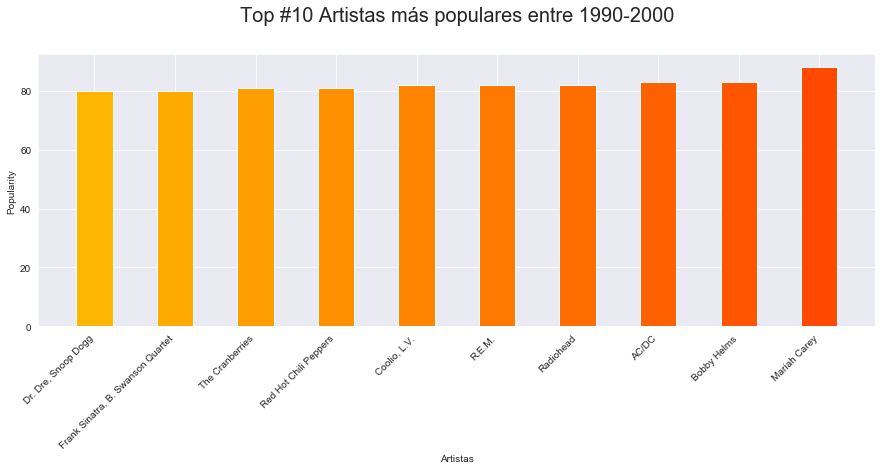

In [43]:
pop = data_group90[['artista','popularity']].sort_values('popularity').tail(10)

fig = plt.figure(figsize=(15,5))
plt.bar( pop['artista'],
         pop['popularity'],
         width=0.45,
         color = ['#ffb600','#ffaa00','#ff9e00','#ff9100','#ff8500','#ff7900','#ff6d00','#ff6000','#ff5400','#ff4800'])
plt.xticks(rotation=45,ha='right')
plt.title('Top #10 Artistas más populares entre 1990-2000', y=1.1,fontsize=20)
plt.xlabel('Artistas')
plt.ylabel('Popularity')
plt.show()

Ahora vemos cuales son las canciones que permiten a estos artistas situarse como los más populares de la decada 1990-2000.

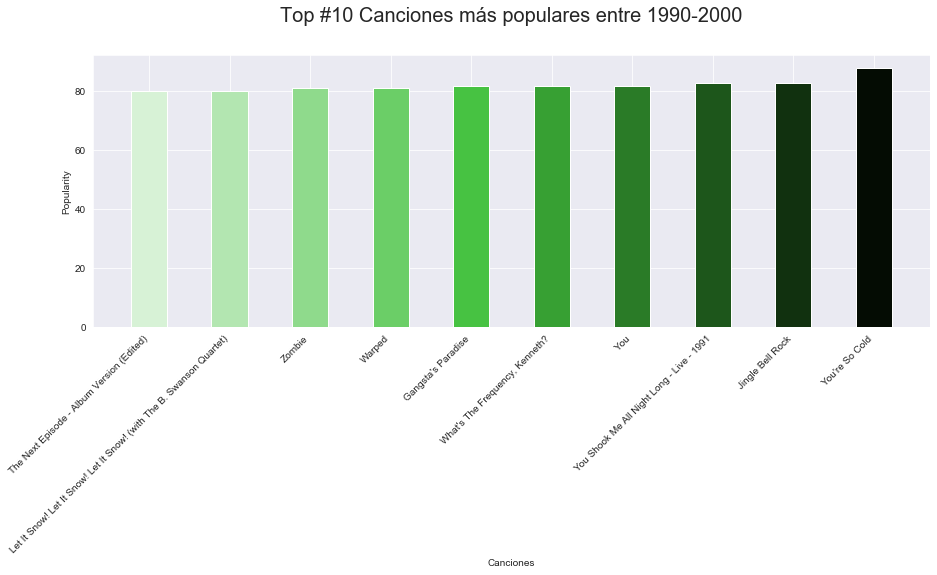

In [44]:
pop = data_group90[['name','popularity']].sort_values('popularity').tail(10)

fig = plt.figure(figsize=(15,5))
plt.bar( pop['name'],
         pop['popularity'],
         width=0.45,
         color = ['#d7f2d6','#b3e6b1','#8fda8c','#6bce67','#47c242','#37a033','#2a7b27','#1d561b','#11310f','#040c03'])
plt.xticks(rotation=45,ha='right')
plt.title('Top #10 Canciones más populares entre 1990-2000', y=1.1,fontsize=20)
plt.xlabel('Canciones')
plt.ylabel('Popularity')
plt.show()

Vemos el mismo análisis pero ahora para el año en curso 2020.

In [45]:
data20 = data[(data['decada'] > 2010)]
data20['artista'] = data20['artists']

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [46]:
group20 = data20.groupby(by='artists').max().sort_values(by= 'popularity', ascending=False)[:50]
data_group20 = group20[['name', 'year', 'popularity', 'artista']]
display(data_group20.tail())

,name,year,popularity,artista
artists,,,,
"Ariana Grande, Justin Bieber",Stuck with U (with Justin Bieber),2020,89,"Ariana Grande, Justin Bieber"
Jerry Di,Mi Cuarto,2020,89,Jerry Di
"Machine Gun Kelly, blackbear",my ex's best friend (with blackbear),2020,88,"Machine Gun Kelly, blackbear"
salem ilese,Mad at Disney,2020,88,salem ilese
"Jack Harlow, Tory Lanez, DaBaby, Lil Wayne","WHATS POPPIN (feat. DaBaby, Tory Lanez & Lil W...",2020,88,"Jack Harlow, Tory Lanez, DaBaby, Lil Wayne"


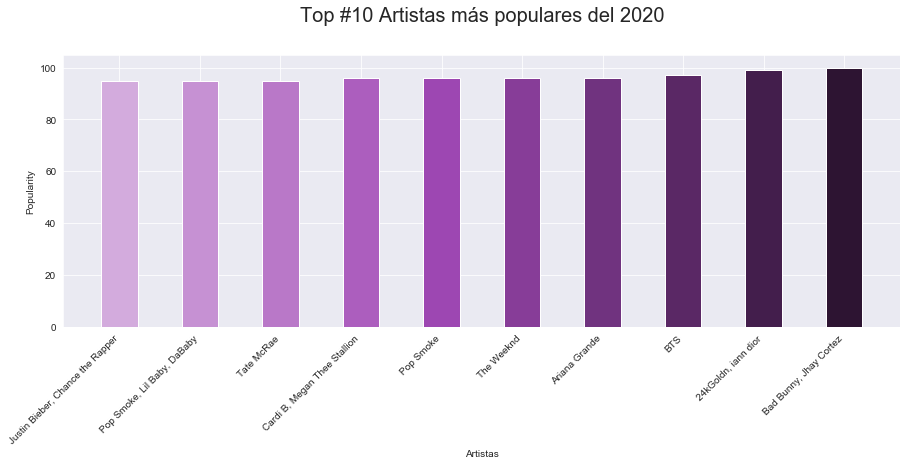

In [47]:
pop = data_group20[['artista','popularity']].sort_values('popularity').tail(10)

fig = plt.figure(figsize=(15,5))
plt.bar( pop['artista'],
         pop['popularity'],
         width=0.45,
         color = ['#d3abdd','#c691d3','#b978c8','#ac5ebe','#9d47b2','#873d98','#70337f','#5a2865','#431e4c','#2d1432'])
plt.xticks(rotation=45,ha='right')
plt.title('Top #10 Artistas más populares del 2020', y=1.1,fontsize=20)
plt.xlabel('Artistas')
plt.ylabel('Popularity')
plt.show()

In [48]:
# Most popular songs by Year
pop_year = data.sort_values('popularity', ascending=False).groupby('year').first()
pop_year = pop_year.reset_index()
pop_year[['year','artists', 'name','popularity']]
pop_year.head()

,year,artists,name,mode,popularity,acousticness,danceability,energy,instrumentalness,valence,tempo,speechiness,minutes,decada,speech
0,1921,KHP Kridhamardawa Karaton Ngayogyakarta Hadini...,Gati Mardika,1,6,0.579,0.697,0.3460,0.16800,0.196,119.824,0.0700,6.584600,1920,Low
1,1922,Uli,Carve,1,6,0.674,0.645,0.4450,0.74400,0.127,104.851,0.4510,2.115050,1920,Medium
2,1923,Bessie Smith,Nobody Knows You When You're Down and Out,1,42,0.996,0.614,0.0423,0.00293,0.211,89.822,0.0535,2.952217,1920,Low
3,1924,"Paul Whiteman & His Orchestra, Bix Beiderbecke",Mississippi Mud (feat. Bix Beiderbecke),1,13,0.816,0.678,0.3950,0.24000,0.832,184.446,0.1330,3.433333,1920,Low
4,1925,Tommy Dorsey,"On the Sunny Side of the Street (From ""Is Ever...",1,37,0.969,0.678,0.1750,0.00105,0.580,112.941,0.0301,3.238667,1920,Low


In [51]:
df_20 = pop_year.tail(20)
df_20.head(3)

,year,artists,name,mode,popularity,acousticness,danceability,energy,instrumentalness,valence,tempo,speechiness,minutes,decada,speech
80,2001,System Of A Down,Chop Suey!,0,80,0.000278,0.419,0.934,0.0015,0.286,127.288,0.1200,3.504000,2000,Low
81,2002,"Eminem, Nate Dogg",'Till I Collapse,1,84,0.062200,0.548,0.847,0.0000,0.100,171.447,0.1860,4.963117,2000,Low
82,2003,Linkin Park,Numb,1,82,0.004600,0.496,0.863,0.0000,0.243,110.018,0.0381,3.093117,2000,Low


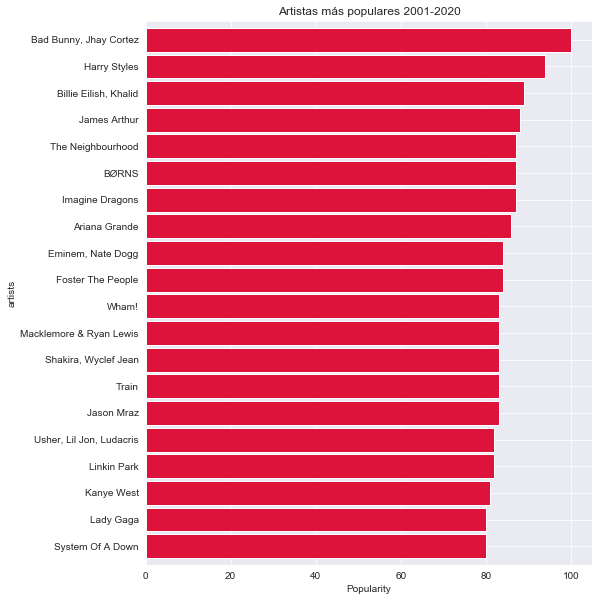

In [50]:
## Gráfico de barras para los artistas más populares entre 2001 - 2020

genres_grp = df_20.groupby(['artists']).max().sort_values(by= 'popularity', ascending=True)
genres_grp

plt.figure(figsize=(8,10))
genres_grp.popularity.plot.barh(color='crimson', width=0.9)
plt.xlabel('Popularity')
plt.title('Artistas más populares 2001-2020')
plt.show()

In [52]:
## Creamos un WorlCloud para las canciones mas escuchadas:

group = data.groupby(by='artists').max().sort_values(by= 'popularity', ascending=False)[:50]
data_group = group.iloc[:,0:3]

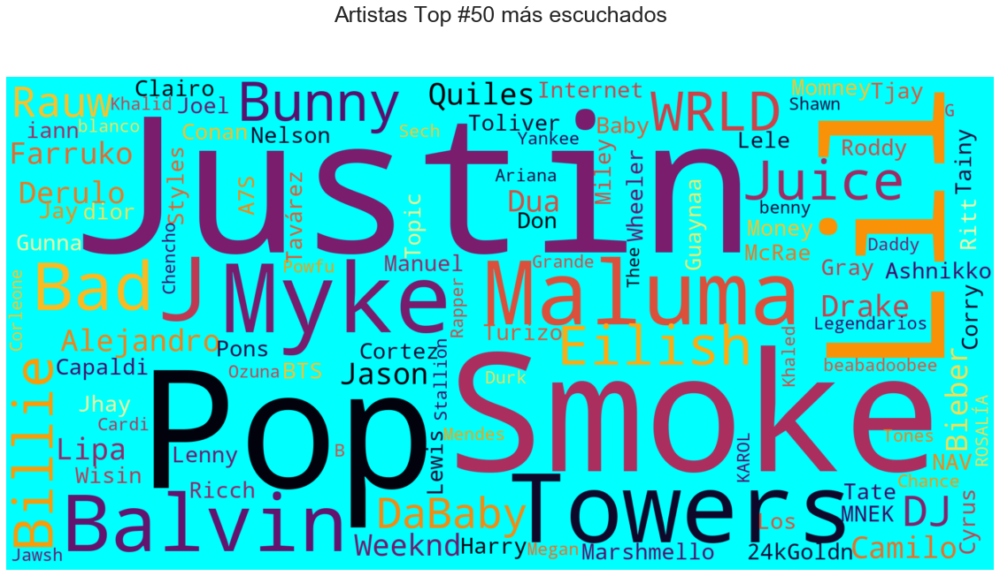

In [53]:
from wordcloud import WordCloud
plt.style.use('seaborn')
wrds1 = data_group.index.value_counts().keys()

wc1 = WordCloud(scale=5,max_words=1000,colormap="inferno",background_color="aqua").generate(" ".join(wrds1))
plt.figure(figsize=(20,18))
plt.imshow(wc1,interpolation="bilinear")
plt.axis("off")
plt.title("Artistas Top #50 más escuchados",y=1.1,fontsize=25)
plt.show()

In [54]:
## Creamos un WorlCloud para los géneros más escuchados:

genres_group = genres.groupby(by='genres').max().sort_values(by= 'popularity', ascending=False)[:50]

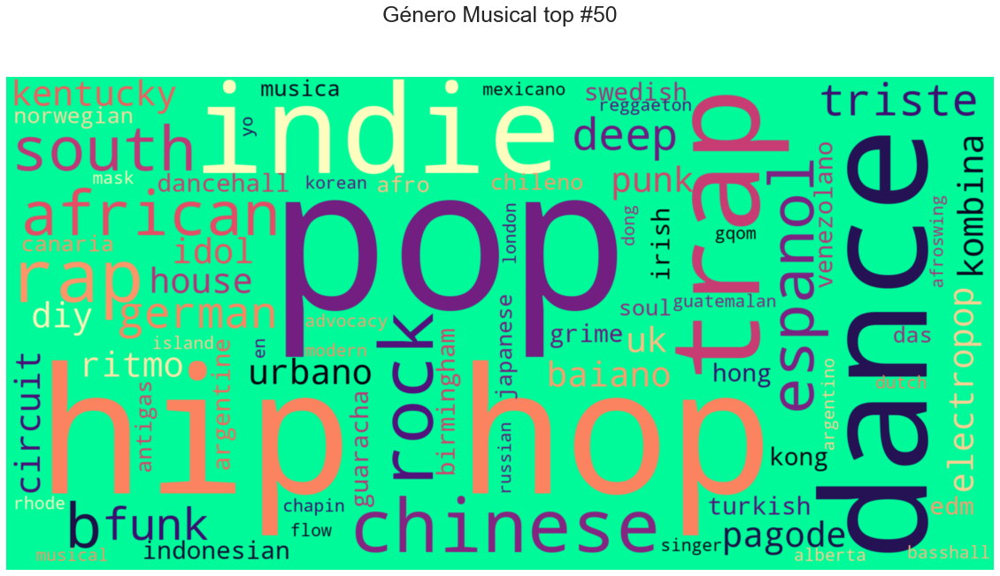

In [55]:
from wordcloud import WordCloud
plt.style.use('seaborn')
wrds1 = genres_group.index.value_counts().keys()

wc1 = WordCloud(scale=5,max_words=1000,colormap="magma",background_color="mediumspringgreen").generate(" ".join(wrds1))
plt.figure(figsize=(20,18))
plt.imshow(wc1,interpolation="quadric")
plt.axis("off")
plt.title("Género Musical top #50",y=1.1,fontsize=25)
plt.show()

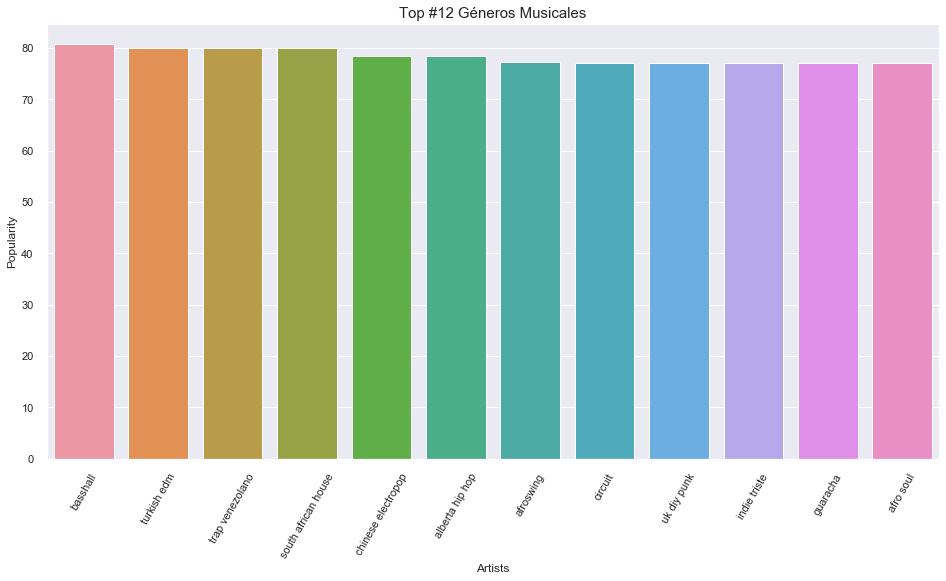

In [56]:
plt.figure(figsize=(16, 8))
sns.set(style="darkgrid")
x = genres_group.groupby("genres")["popularity"].mean().sort_values(ascending=False).head(12)
ax = sns.barplot(x.index, x)
ax.set_title('Top #12 Géneros Musicales', fontsize= 15)
ax.set_ylabel('Popularity')
ax.set_xlabel('Artists')
plt.xticks(rotation = 60)
plt.show()

<Figure size 864x576 with 0 Axes>

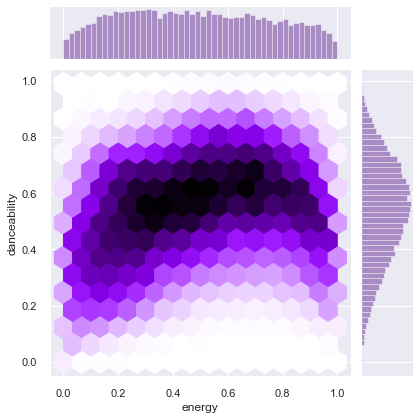

In [57]:
## Joinplot de la variable energy y danceability:


plt.figure(figsize=(12,8))
sns.jointplot(data=data, x='energy', y='danceability',color= 'indigo', kind='hex', joint_kws={'gridsize':15})
plt.show()

<Figure size 864x576 with 0 Axes>

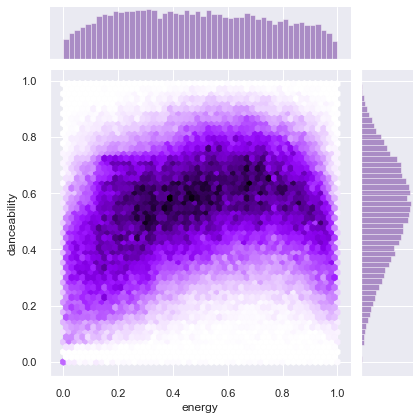

In [58]:
## Joinplot de la variable energy y danceability con kind=hex:

plt.figure(figsize=(12,8))
sns.jointplot(data=data, x='energy', y='danceability',color= 'indigo', kind='hex')
plt.show()

## 4. Análisis Estadístico 

Para llevar adelante cierto analisis estadistico de los datasets se procede a implementar el concepto teorico del Teorema Central del Limite.

El **teorema central del límite** (TCL) es una teoría estadística que establece que, dada una muestra suficientemente grande de la población, la distribución de las medias muestrales seguirá una distribución normal.

Para ello, vamos a seleccionar del dataset data una muestra aleatoria de 5000 casos y lo guardamos en dos objetos m1 y m2 que seran nuestras muestras.

In [59]:
m1 = data.sample(n= 5000,random_state=10)
m2 = data.sample(n= 5000,random_state=20)

La variable con la cual vamos a trabajar para estudiar el teorema central del limite es la variable danceability la cual se puede apreciar tiene una forma aproximada a una curva normal.

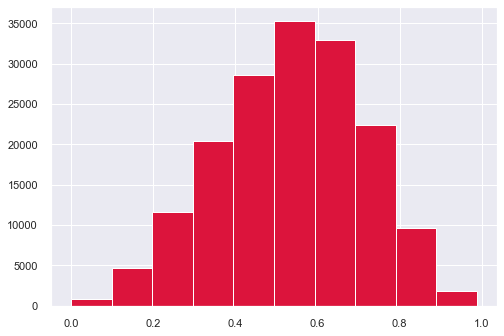

In [60]:
data.danceability.hist(color='crimson');

In [61]:
## Seleccionamos la media de la variable danceability en m1:

round(m1.danceability.mean(),4)

0.5297

In [62]:
## Seleccionamos la media de la variable danceability en m2:

round(m2.danceability.mean(),4)

0.5332

In [ ]:
Por lo tanto vamos a proceder a estimar un intervalo de confianza del 95% para la media de danceability.

In [63]:
def ic_mean(confidence=0.95):
       n = len(m1)
       m, se = m1.danceability.mean() , np.std(m1.danceability)
       h = se * norm.ppf((1+confidence)/2)/np.sqrt(n)
       print("Intervalo de Confianza para la media Danceability en m1: ")
       return round(m-h,3), round(m+h,3)

ic_mean()

Intervalo de Confianza para la media Danceability en m1: 


(0.525, 0.535)

In [64]:
def ic_mean(confidence=0.95):
       n = len(m2)
       m, se = m2.danceability.mean() , np.std(m2.danceability)
       h = se * norm.ppf((1+confidence)/2)/np.sqrt(n)
       print("Intervalo de Confianza para la media Danceability en m2: ")
       return round(m-h,3), round(m+h,3)

ic_mean()

Intervalo de Confianza para la media Danceability en m2: 


(0.528, 0.538)

Recordemos que la media poblacional de danceability es 0.5353 y que ambos intervalos tanto en m1 y m2 contienen la media de la variable.

In [65]:
round(data.danceability.mean(),4)

0.5353

Para finalizar con el análisis veremos a partir de la variable **tempo**, el cálculo de algunas probabilidades a partir del uso de la librería Scipy. 

En **terminología musical**, el tempo es la velocidad o ritmo de una pieza determinada y se deriva directamente de la duración media del tiempo.

Si bien se desconoce si la variable tiene una distribucion normal, graficamente se acerca bastante a ella como se puede apreciar en el siguiente histograma.

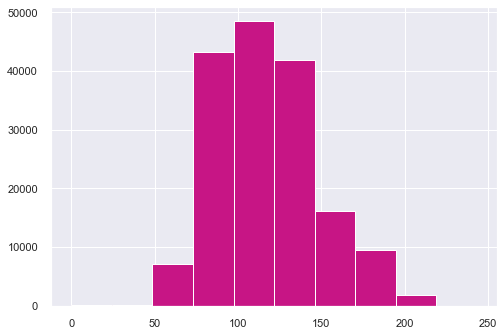

In [66]:
data.tempo.hist(color='mediumvioletred');

In [67]:
## Estadisticas de la variable templo:

data.tempo.describe()

count    168374.000000
mean        116.936624
std          30.692127
min           0.000000
25%          93.560250
50%         114.828000
75%         135.649000
max         243.507000
Name: tempo, dtype: float64

A partir de los datos presentados se pretende analizar la probabilidad de que la variable tempo sea mayor a 150 y la probabilidad de que la variable sea menor a 100.

Es decir **P (x > 150)**  y **P (x < 100)**:




In [68]:
## P (x > 150):

z = ((150 - data.tempo.mean())/data.tempo.std())
print("La probabilidad de que la variable tempo sea mayor a 150:\n")
print("P(x > 150) = ", round(norm.sf(z),4))

La probabilidad de que la variable tempo sea mayor a 150:

P(x > 150) =  0.1407


In [69]:
## P (x < 100):

z = ((100 - data.tempo.mean())/data.tempo.std())
print("La probabilidad de que la variable tempo sea menor a 100:\n")
print("P(x < 100) = ", round(norm.cdf(z),4))

La probabilidad de que la variable tempo sea menor a 100:

P(x < 100) =  0.2905


Como se puede apreciar en las estadísticas resumen a partir del método **describe**, la mediana de la variable tempo es 114.83, lo cual si entendemos que la variable sigue una distribución normal, por las características de este tipo de distribución la probabilidad de que la variable sea mayor o menor a dicha medida debe ser 0.5.

Veremos si eso ocurre con el calculo de la probabilidad de que la variable sea menor a 114.83

In [70]:
## P (x < 114.83):

z = ((114.83 - data.tempo.mean())/data.tempo.std())
print("La probabilidad de que la variable tempo sea menor a 114.83:\n")
print("P(x < 114.83) = ", round(norm.cdf(z),4))

La probabilidad de que la variable tempo sea menor a 114.83:

P(x < 114.83) =  0.4726


In [75]:
## Error:

e = round(norm.cdf(z),4)  - 0.5
print("Error =",round(abs(e),4)*100, "%")

Error = 2.74 %


La probabilidad se aproxima a 0.5 con un error del 2.7%.

## 5. Fin

Llegamos al final del proyecto en donde se fue buscando recorrer las distintas posibilidades que nos permiten algunas de las librerias de python con la finalidad de cumplir los objetivos propuestos.

Seguramente hayan quedado algunas funciones pendientes por cubrir, pero el tiempo disponible solo ha permitido mostrar lo descripto en los capítulos anteriores.

Solo queda seguir aprendiendo cada día un poco más de la magia que nos permite el lenguaje de programación Python.


<img src= 'https://static4.abc.es/media/bienestar/2019/11/28/dar-gracias-6-k2EB--1024x512@abc.jpg'
width=80% height=60% >